In [1]:
# Add at the beginning of your notebook to make imports work
import sys
import os

# Get the absolute path to the project root directory (one level up from notebooks)
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Add the project root to Python's import path if it's not already there
if project_root not in sys.path:
    sys.path.insert(0, project_root)
    print(f"Added {project_root} to Python path")

import scripts.simulation_runner as sim
import visualizations.comparison_plots as comp_plots

Added /Users/amber/Desktop/Simulation/Avail-Fusion-CryptoEcon to Python path


In [2]:
base_config = sim.SimulationConfig(restaking=1.0, avl_price_growth=0, eth_price_growth=0, btc_price_growth=0) # All Neutral 

# Define comparison configurations
comparisons = [
    {'restaking': 1.0, "avl_price_growth":-0.4, "eth_price_growth":-0.4, "btc_price_growth":-0.4}, # All Bearish
    {'restaking': 1.0, "avl_price_growth":1, "eth_price_growth":1, "btc_price_growth":1}, # All Bullish

    {'restaking': 1.0, "avl_price_growth":1.5, "eth_price_growth":0.5, "btc_price_growth":0.5}, # Alpha Outperforms - Bull Market
    {'restaking': 1.0, "avl_price_growth":-0.2, "eth_price_growth":-0.5, "btc_price_growth":-0.5}, # Alpha Underperforms - Bear Market
    {'restaking': 1.0, "avl_price_growth": 0.5, "eth_price_growth":1.5, "btc_price_growth":1.5}, # Beta Outperforms - Bull Market
    {'restaking': 1.0, "avl_price_growth":-0.5, "eth_price_growth":-0.2, "btc_price_growth":-0.2}, # Beta Outperforms - Bear Market

    {'restaking': 1.0, "avl_price_growth":1, "eth_price_growth":0.5, "btc_price_growth":-0.3}, # Uncorrelated Bull/Bear Mix:
    {'restaking': 1.0, "avl_price_growth":-0.4, "eth_price_growth":0, "btc_price_growth":0}, # Fully Mixed Performance
]

# Run comparisons
results = sim.compare_simulations(
    base_config=base_config,
    comparison_configs=comparisons,
    names=["All Neutral ", "All Bearish", "All Bullish", "Alpha Outperforms - Bull Market", "Alpha Underperforms - Bear Market", "Beta Outperforms - Bull Market", "Beta Outperforms - Bear Market", "Uncorrelated Bull/Bear Mix", "Fully Mixed Performance"],
)

# Access individual results
for name, df in results.items():
    print(f"Results for {name}:")

Running All Neutral  (base simulation)...
Running Avail Fusion simulation for 365 days...
###########################
timestep 0
[DEBUG] update_token_prices
  AVL Flow: $33,314.00 (D: $238,770.33, W: $205,456.33)
  ETH Flow: $24,781.04 (D: $52,014.32, W: $27,233.28)

💰 REWARDS ALLOCATION - DAY 1
AVL Price: $0.1000
Total AVL Pool Balance: 9,333,140.03 AVL
AVL Boosting Enabled: True

--- AVL Pool ---
  avl_maxi: TVL: $933,314.00
    Unlocked: 9333140.03 AVL
    Pool Share: 100.000%
    Boost Multiplier: 1.100x
    Base Rewards: 1,399,971.00 AVL/year
    Boosted Rewards: 1,539,968.10 AVL/year

--- ETH Pool ---
  eth_maxi: ETH TVL: $474,781.04, Yield: 3.50%, Rewards: 166,173.36 AVL/year
⚠️  WARNING: AVL pool has excessive unused budget: 299,998,460,032 AVL
   Required: 1,539,968 AVL, Ratio: 194808.2x
⚠️  WARNING: ETH pool has excessive unused budget: 8,999,833,827 AVL
   Required: 166,173 AVL, Ratio: 54159.3x

📊 Final Reward Summary:
  avl_maxi: 1,539,968.10 AVL/year
  eth_maxi: 166,173.36

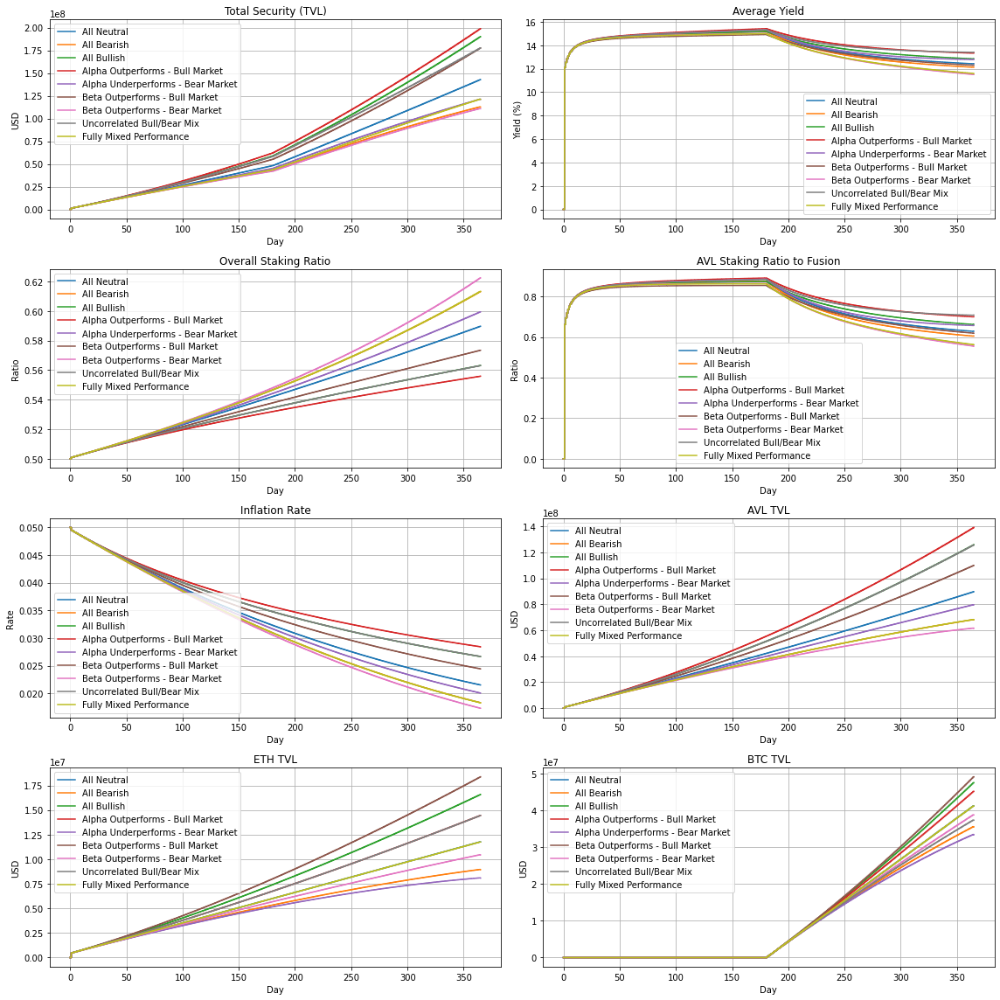

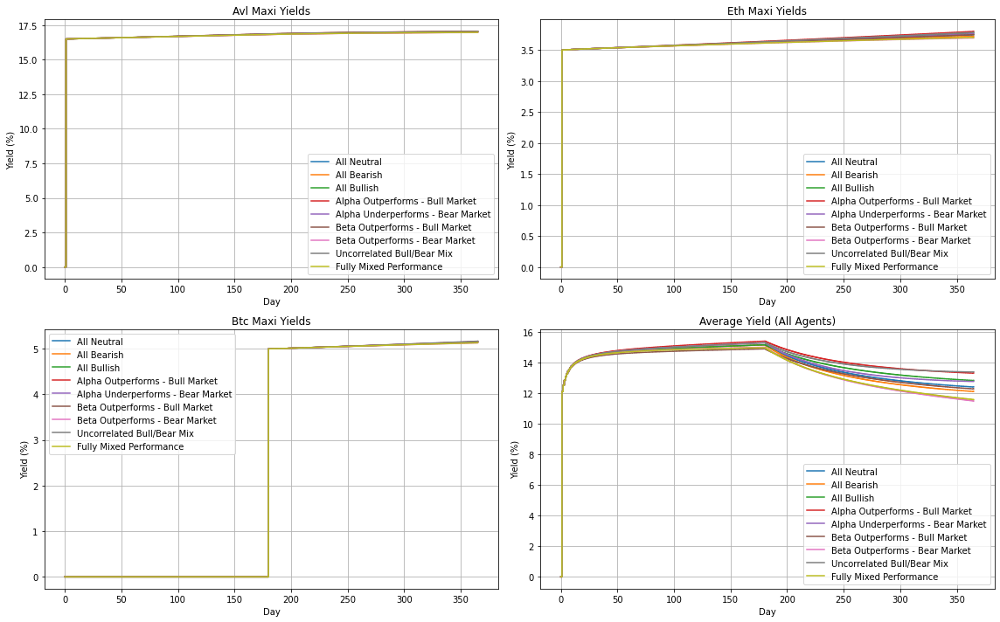

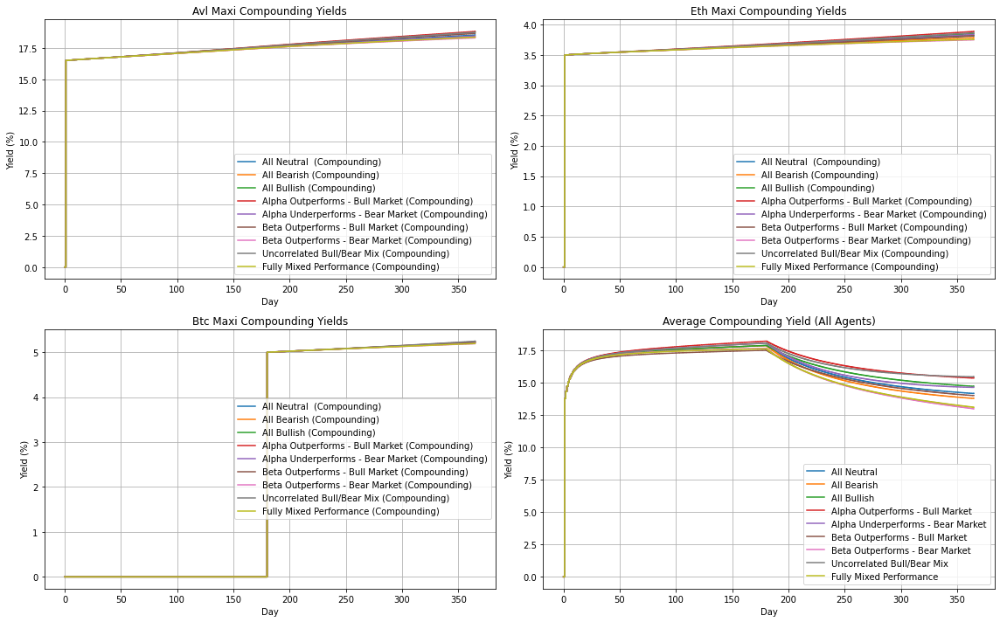

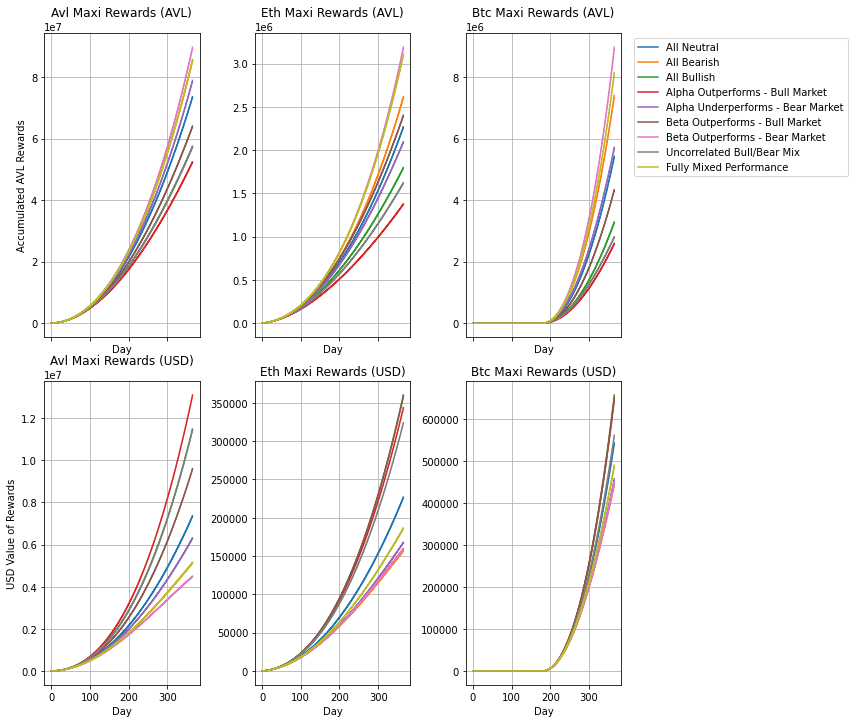

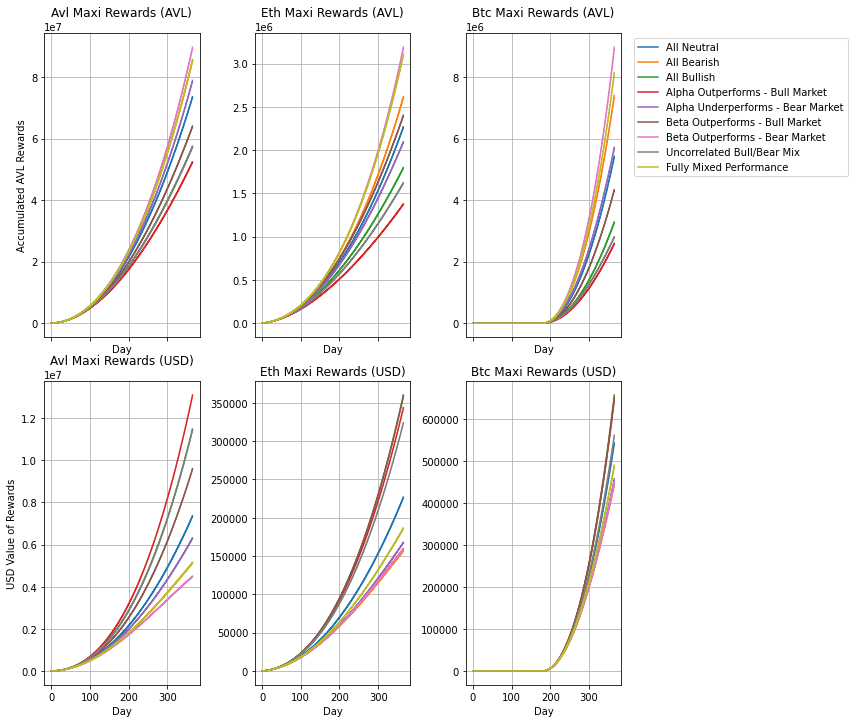

In [3]:
# Create a comprehensive dashboard comparing all scenarios
comp_plots.plot_comparison_dashboard(results)

# Compare yields across scenarios
comp_plots.plot_yields_comparison(results)

# Compare accumulated rewards
comp_plots.plot_rewards_comparison(results)

In [4]:
results['All Neutral ']

,timestep,agents,pool_manager,target_yields,total_security,tvl,staked_token_balances,total_fdv,staking_ratio_all,staking_ratio_fusion,...,total_annual_inflation_rewards_in_avl,total_annual_inflation_rewards_usd,yield_pcts,avg_yield,compounding_yield_pcts,compounding_avg_yield,simulation,subset,run,substep
0,0,{'avl_maxi': AgentStake(assets={'AVL': AssetAl...,"PoolManager(total_budget=30000000000.0, pools=...","{'AVL': 0.15, 'ETH': 0.035}",0.000000e+00,{},"{'AVL': 9000000.0, 'ETH': 300, 'BTC': 0.1}",1.000000e+09,0.500000,"{'AVL': 0, 'ETH': 0}",...,5.000000e+08,5.000000e+07,"{'avl_maxi': 0, 'eth_maxi': 0, 'btc_maxi': 0}",0.000000,{},0.000000,0,0,1,0
1,1,{'avl_maxi': AgentStake(assets={'AVL': AssetAl...,"PoolManager(total_budget=30000000000.0, pools=...","{'AVL': 0.15, 'ETH': 0.035}",0.000000e+00,{},"{'AVL': 9000000.0, 'ETH': 300, 'BTC': 0.1}",1.000000e+09,0.500000,"{'AVL': 0, 'ETH': 0}",...,5.000000e+08,5.000000e+07,"{'avl_maxi': 0, 'eth_maxi': 0, 'btc_maxi': 0}",0.000000,{},0.000000,0,0,1,1
2,1,{'avl_maxi': AgentStake(assets={'AVL': AssetAl...,"PoolManager(total_budget=30000000000.0, pools=...","{'AVL': 0.15, 'ETH': 0.035}",0.000000e+00,{},"{'AVL': 9000000.0, 'ETH': 300, 'BTC': 0.1}",1.000000e+09,0.500000,"{'AVL': 0, 'ETH': 0}",...,5.000000e+08,5.000000e+07,"{'avl_maxi': 0, 'eth_maxi': 0, 'btc_maxi': 0}",0.000000,{},0.000000,0,0,1,2
3,1,{'avl_maxi': AgentStake(assets={'AVL': AssetAl...,"PoolManager(total_budget=30000000000.0, pools=...","{'AVL': 0.15, 'ETH': 0.035}",1.408095e+06,"{'ETH': 474781.0420322906, 'AVL': 933314.00274...","{'ETH': 316.5206946881937, 'AVL': 9333140.0274...",1.000000e+09,0.500933,"{'AVL': 0.662820316148359, 'ETH': 0.3371796838...",...,5.000000e+08,5.000000e+07,"{'avl_maxi': 0, 'eth_maxi': 0, 'btc_maxi': 0}",0.000000,{},0.000000,0,0,1,3
4,1,{'avl_maxi': AgentStake(assets={'AVL': AssetAl...,"PoolManager(total_budget=30000000000.0, pools=...","{'AVL': 0.15, 'ETH': 0.035}",1.408095e+06,"{'ETH': 474781.0420322906, 'AVL': 933314.00274...","{'ETH': 316.5206946881937, 'AVL': 9333140.0274...",1.000000e+09,0.500933,"{'AVL': 0.662820316148359, 'ETH': 0.3371796838...",...,4.948579e+08,4.948579e+07,"{'avl_maxi': 0, 'eth_maxi': 0, 'btc_maxi': 0}",0.000000,{},0.000000,0,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3281,365,{'avl_maxi': AgentStake(assets={'AVL': AssetAl...,"PoolManager(total_budget=60000000000.0, pools=...","{'AVL': 0.15, 'ETH': 0.035, 'BTC': 0.05}",1.426617e+08,"{'ETH': 11760510.495814314, 'AVL': 89656780.44...","{'ETH': 7840.3403305428765, 'AVL': 896567804.4...",1.000000e+09,0.589657,"{'AVL': 0.6284573514693318, 'ETH': 0.082436367...",...,2.154177e+08,2.154177e+07,"{'avl_maxi': 17.006668604157078, 'eth_maxi': 3...",12.417781,"{'avl_maxi': 18.525604411863025, 'eth_maxi': 3...",14.178427,0,0,1,5
3282,365,{'avl_maxi': AgentStake(assets={'AVL': AssetAl...,"PoolManager(total_budget=60000000000.0, pools=...","{'AVL': 0.15, 'ETH': 0.035, 'BTC': 0.05}",1.426617e+08,"{'ETH': 11760510.495814314, 'AVL': 89656780.44...","{'ETH': 7840.3403305428765, 'AVL': 896567804.4...",1.000000e+09,0.589657,"{'AVL': 0.6284573514693318, 'ETH': 0.082436367...",...,2.154177e+08,2.154177e+07,"{'avl_maxi': 17.006668604157078, 'eth_maxi': 3...",12.417781,"{'avl_maxi': 18.525604411863025, 'eth_maxi': 3...",14.178427,0,0,1,6
3283,365,{'avl_maxi': AgentStake(assets={'AVL': AssetAl...,"PoolManager(total_budget=60000000000.0, pools=...","{'AVL': 0.15, 'ETH': 0.035, 'BTC': 0.05}",1.426617e+08,"{'ETH': 11760510.495814314, 'AVL': 89656780.44...","{'ETH': 7840.3403305428765, 'AVL': 896567804.4...",1.000000e+09,0.589657,"{'AVL': 0.6284573514693318, 'ETH': 0.082436367...",...,2.154177e+08,2.154177e+07,"{'avl_maxi': 17.00841714438635, 'eth_maxi': 3....",12.420406,"{'avl_maxi': 18.525604411863025, 'eth_maxi': 3...",14.178427,0,0,1,7
3284,365,{'avl_maxi': AgentStake(assets={'AVL': AssetAl...,"PoolManager(total_budget=60000000000.0, pools=...","{'AVL': 0.15, 'ETH': 0.035, 'BTC': 0.05}",1.426617e+08,"{

In [5]:
import pandas as pd
import numpy as np

def analyze_user_portfolio(df, allocations, initial_deposit=100):
    """
    Analyze how a user with specified allocations would perform based on simulation results.
    Only uses the last substep for each timestep in the analysis.
    
    Args:
        df: DataFrame with simulation results including timestep and substep
        allocations: Dictionary mapping allocation names to asset allocation dictionaries
        initial_deposit: Initial deposit amount in USD
        
    Returns:
        DataFrame with performance metrics for each allocation
    """

    
    # Filter to get only the last substep for each timestep
    last_substeps = df.groupby('timestep')['substep'].max().reset_index()
    filtered_df = pd.merge(df, last_substeps, on=['timestep', 'substep'])
    
    # Sort by timestep to ensure chronological order
    filtered_df = filtered_df.sort_values('timestep')
    
    results = []
    
    # Get data for day 1 and day 365 (or the last available day)
    day1 = filtered_df[filtered_df['timestep'] == 1].iloc[0] if 1 in filtered_df['timestep'].values else filtered_df.iloc[0]
    last_day = filtered_df[filtered_df['timestep'] == 365].iloc[0] if 365 in filtered_df['timestep'].values else filtered_df.iloc[-1]
    
    # Get prices on day 1
    day1_prices = {
        'AVL': day1['agents']['avl_maxi'].assets['AVL'].price,
        'ETH': day1['agents']['eth_maxi'].assets['ETH'].price,
        'BTC': day1['agents']['btc_maxi'].assets['BTC'].price if 'BTC' in day1['agents']['btc_maxi'].assets else 0
    }
    
    # Get prices on last day
    last_day_prices = {
        'AVL': last_day['agents']['avl_maxi'].assets['AVL'].price,
        'ETH': last_day['agents']['eth_maxi'].assets['ETH'].price,
        'BTC': last_day['agents']['btc_maxi'].assets['BTC'].price if 'BTC' in last_day['agents']['btc_maxi'].assets else 0
    }
    
    # Process each allocation strategy
    for allocation_name, allocation in allocations.items():
        # Calculate initial token amounts
        initial_tokens = {}
        for asset, alloc_pct in allocation.items():
            if day1_prices[asset] > 0:
                initial_tokens[asset] = (initial_deposit * alloc_pct) / day1_prices[asset]
            else:
                initial_tokens[asset] = 0
        
        # Track rewards and token balances over time
        avl_rewards = 0
        token_balances = initial_tokens.copy()
        day_counter = 0  # To track actual days (some timesteps might be missing)
        
        # Process each timestep to track compounding
        for _, row in filtered_df.iterrows():
            timestep = row['timestep']
            if timestep <= 1:
                continue  # Skip initial timestep
            
            day_counter += 1
            
            # Get yield percentages for this timestep
            yields = {}
            for asset in allocation.keys():
                agent_key = f"{asset.lower()}_maxi"
                if agent_key in row['yield_pcts']:
                    yields[asset] = row['yield_pcts'][agent_key]/100
                else:
                    yields[asset] = 0
            
            # Calculate daily rewards in AVL tokens
            for asset, balance in token_balances.items():
                agent_key = f"{asset.lower()}_maxi"
                # Skip if no data for this asset
                if agent_key not in row['agents']:
                    continue
                    
                # Get price for this asset and AVL
                asset_price = row['agents'][agent_key].assets[asset].price
                avl_price = row['agents']['avl_maxi'].assets['AVL'].price
                
                # Calculate daily yield in USD, then convert to AVL
                # Using actual daily yield (annual yield / 365)
                daily_yield_usd = (balance * asset_price * yields[asset]) / 365
                daily_yield_avl = daily_yield_usd / avl_price if avl_price > 0 else 0
                
                # Accumulate AVL rewards
                avl_rewards += daily_yield_avl
            
            # Reinvest rewards into AVL tokens
            token_balances['AVL'] += avl_rewards
            avl_rewards = 0  # Reset after reinvesting
        
        # Calculate final values
        final_value_usd = sum(token_balances[asset] * last_day_prices[asset] for asset in token_balances)
        
        # Calculate AVL rewards value in USD (final AVL balance - initial AVL balance)
        initial_avl = initial_tokens.get('AVL', 0)
        rewards_avl = token_balances['AVL'] - initial_avl
        rewards_usd = rewards_avl * last_day_prices['AVL']
        
        # Calculate initial portfolio value for accurate return ratio
        initial_value_usd = sum(initial_tokens[asset] * day1_prices[asset] for asset in initial_tokens)
        
        # Calculate average yield from the simulation data
        avg_portfolio_yield = 0
        for asset, alloc_pct in allocation.items():
            agent_key = f"{asset.lower()}_maxi"
            
            # Get all yields for this agent throughout the simulation
            asset_yields = []
            for _, r in filtered_df.iterrows():
                if agent_key in r['yield_pcts']:
                    asset_yields.append(r['yield_pcts'][agent_key])
            
            # Calculate average yield for this asset if data exists
            if asset_yields:
                avg_asset_yield = sum(asset_yields) / len(asset_yields)
                avg_portfolio_yield += avg_asset_yield * alloc_pct
        
        # Calculate return ratio (considering price appreciation and staking rewards)
        return_ratio = (rewards_usd + final_value_usd -  initial_deposit) / initial_deposit 
        
        
        # Store results
        results.append({
            'Allocation': allocation_name,
            'Rewards (AVL)': rewards_avl,
            'Rewards (USD)': rewards_usd,
            'Avg Yield': avg_portfolio_yield,
            'Initial Value (USD)': initial_value_usd, 
            'Final Staked Value (USD)': final_value_usd,
            'Return Ratio (Rewards/Initial)': return_ratio,
        })
    
    return pd.DataFrame(results)

# Define user allocations
allocations = {
    '10% AVL, 90% ETH': {'AVL': 0.1, 'ETH': 0.9, 'BTC': 0},
    '80% AVL, 20% BTC': {'AVL': 0.8, 'ETH': 0, 'BTC': 0.2}
}

# Example usage with a single dataframe:
# results = analyze_user_portfolio(df, allocations)
# results

In [6]:
def analyze_multiple_scenarios(scenarios, allocations, initial_deposit=100):
    """
    Analyze user portfolios across multiple scenarios.
    
    Args:
        scenarios: Dictionary mapping scenario names to DataFrames
        allocations: Dictionary mapping allocation names to asset allocation dictionaries
        initial_deposit: Initial deposit amount in USD
        
    Returns:
        DataFrame with results for all scenarios and allocations
    """
    all_results = []
    
    for scenario_name, df in scenarios.items():
        # Analyze this scenario
        scenario_results = analyze_user_portfolio(df, allocations, initial_deposit)
        
        # Add scenario name to results
        scenario_results['Scenario'] = scenario_name
        
        # Add to combined results
        all_results.append(scenario_results)
    
    # Combine all results
    return pd.concat(all_results, ignore_index=True)

# Example usage:
# all_scenario_results = analyze_multiple_scenarios(scenarios, allocations)
# all_scenario_results

In [7]:
def generate_report(results):
    """Generate a readable report from analysis results"""
    # Check if we have multiple scenarios
    if 'Scenario' in results.columns:
        # Group by scenario and allocation
        for scenario, group in results.groupby('Scenario'):
            print(f"\n=== SCENARIO: {scenario} ===\n")
            for _, row in group.iterrows():
                print(f"Portfolio: {row['Allocation']}")
                print(f"1. Rewards after 1 year:")
                print(f"   - {row['Rewards (AVL)']:.2f} AVL tokens")
                print(f"   - ${row['Rewards (USD)']:.2f} USD value")
                print(f"2. Average yield: {row['Avg Yield']:.2f}%")
                print(f"3. Staked values after 1 year: ${row['Final Staked Value (USD)']:.2f}")
                print(f"4. Return ratio (rewards/initial): {row['Return Ratio (Rewards/Initial)']*100:.2f}%")
                print("-" * 50)
    else:
        # Single scenario
        for _, row in results.iterrows():
            print(f"Portfolio: {row['Allocation']}")
            print(f"1. Rewards after 1 year:")
            print(f"   - {row['Rewards (AVL)']:.2f} AVL tokens")
            print(f"   - ${row['Rewards (USD)']:.2f} USD value")
            print(f"2. Average yield: {row['Avg Yield']:.2f}%")
            print(f"3. Staked values after 1 year: ${row['Final Staked Value (USD)']:.2f}")
            print(f"4. Return ratio (rewards/initial): {row['Return Ratio (Rewards/Initial)']*100:.2f}%")
            print("-" * 50)

In [8]:
# # For a single simulation result DataFrame:
# results = analyze_user_portfolio(df, allocations)
# generate_report(results)

# For multiple scenarios:
scenario_results = analyze_multiple_scenarios(results, allocations)
generate_report(scenario_results)


=== SCENARIO: All Bearish ===

Portfolio: 10% AVL, 90% ETH
1. Rewards after 1 year:
   - 53.55 AVL tokens
   - $3.22 USD value
2. Average yield: 4.92%
3. Staked values after 1 year: $63.33
4. Return ratio (rewards/initial): -33.45%
--------------------------------------------------
Portfolio: 80% AVL, 20% BTC
1. Rewards after 1 year:
   - 151.24 AVL tokens
   - $9.09 USD value
2. Average yield: 13.92%
3. Staked values after 1 year: $69.20
4. Return ratio (rewards/initial): -21.71%
--------------------------------------------------

=== SCENARIO: All Bullish ===

Portfolio: 10% AVL, 90% ETH
1. Rewards after 1 year:
   - 53.77 AVL tokens
   - $10.74 USD value
2. Average yield: 4.94%
3. Staked values after 1 year: $210.46
4. Return ratio (rewards/initial): 121.20%
--------------------------------------------------
Portfolio: 80% AVL, 20% BTC
1. Rewards after 1 year:
   - 151.56 AVL tokens
   - $30.27 USD value
2. Average yield: 13.94%
3. Staked values after 1 year: $230.00
4. Return rati

In [9]:
analysis = analyze_user_portfolio(results['All Neutral '], allocations)
generate_report(analysis)

Portfolio: 10% AVL, 90% ETH
1. Rewards after 1 year:
   - 53.64 AVL tokens
   - $5.36 USD value
2. Average yield: 4.93%
3. Staked values after 1 year: $105.36
4. Return ratio (rewards/initial): 10.73%
--------------------------------------------------
Portfolio: 80% AVL, 20% BTC
1. Rewards after 1 year:
   - 151.37 AVL tokens
   - $15.14 USD value
2. Average yield: 13.93%
3. Staked values after 1 year: $115.14
4. Return ratio (rewards/initial): 30.27%
--------------------------------------------------


🔍 Analyzing Multiple Scenarios...
Scenarios: ['All Neutral ', 'All Bearish', 'All Bullish', 'Alpha Outperforms - Bull Market', 'Alpha Underperforms - Bear Market', 'Beta Outperforms - Bull Market', 'Beta Outperforms - Bear Market', 'Uncorrelated Bull/Bear Mix', 'Fully Mixed Performance']
Portfolio Types: ['10% AVL, 90% ETH', '80% AVL, 20% BTC']
Initial Deposit: $100

📊 Analysis Complete! Found 18 scenario-portfolio combinations
🎨 Creating Analysis Plots...
📊 Generating scatterplot: AVL Tokens vs USD Rewards...
Scatterplot saved to comparison_plots/avl_tokens_vs_usd_rewards_scatter.png
📊 Generating barplot: Return Ratios by Portfolio and Scenario...
Barplot saved to comparison_plots/return_ratio_grouped_barplot.png


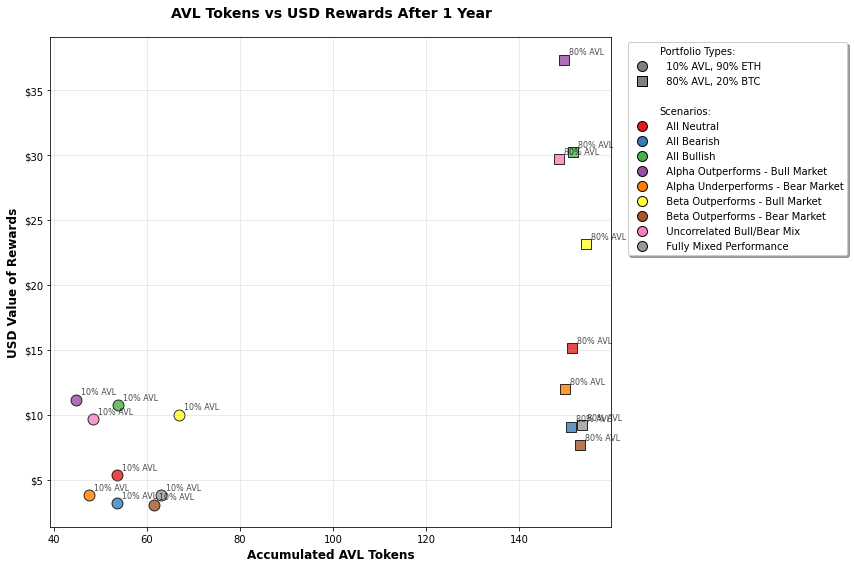

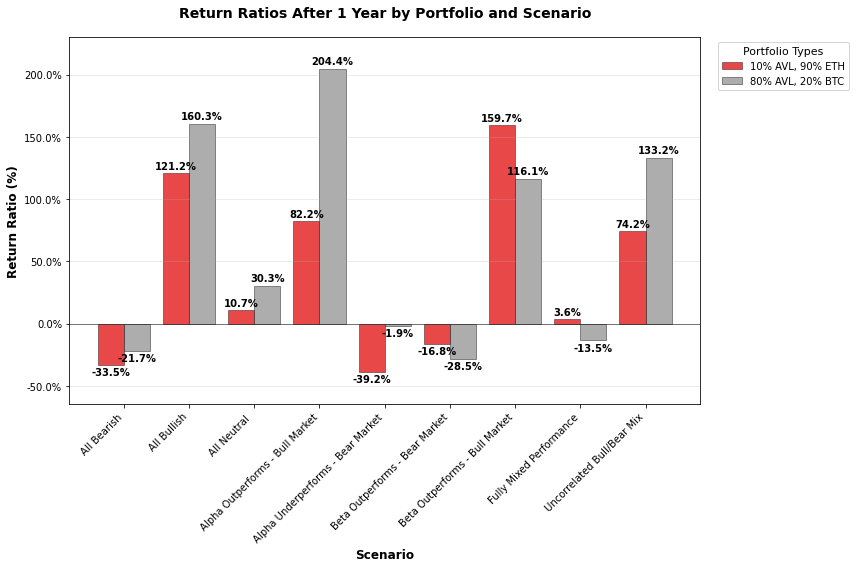


✅ Analysis plots completed!
📁 Plots saved to 'comparison_plots' directory

📋 SUMMARY OF RESULTS:
All Neutral  | 10% AVL, 90% ETH:
  - Rewards: 53.6 AVL ($5.4)
  - Return Ratio: 10.7%

All Neutral  | 80% AVL, 20% BTC:
  - Rewards: 151.4 AVL ($15.1)
  - Return Ratio: 30.3%

All Bearish | 10% AVL, 90% ETH:
  - Rewards: 53.6 AVL ($3.2)
  - Return Ratio: -33.5%

All Bearish | 80% AVL, 20% BTC:
  - Rewards: 151.2 AVL ($9.1)
  - Return Ratio: -21.7%

All Bullish | 10% AVL, 90% ETH:
  - Rewards: 53.8 AVL ($10.7)
  - Return Ratio: 121.2%

All Bullish | 80% AVL, 20% BTC:
  - Rewards: 151.6 AVL ($30.3)
  - Return Ratio: 160.3%

Alpha Outperforms - Bull Market | 10% AVL, 90% ETH:
  - Rewards: 44.7 AVL ($11.2)
  - Return Ratio: 82.2%

Alpha Outperforms - Bull Market | 80% AVL, 20% BTC:
  - Rewards: 149.7 AVL ($37.4)
  - Return Ratio: 204.4%

Alpha Underperforms - Bear Market | 10% AVL, 90% ETH:
  - Rewards: 47.6 AVL ($3.8)
  - Return Ratio: -39.2%

Alpha Underperforms - Bear Market | 80% AVL, 20% 

In [10]:
# Import the plotting functions
from visualizations.generate_comparison_plots import generate_comparison_plots

# Define portfolio allocations (or use defaults)
allocations = {
    '10% AVL, 90% ETH': {'AVL': 0.1, 'ETH': 0.9, 'BTC': 0},
    '80% AVL, 20% BTC': {'AVL': 0.8, 'ETH': 0, 'BTC': 0.2}
}

# Generate both plots
report_results = generate_comparison_plots(
    scenarios_dict=results,
    allocations_dict=allocations,
    initial_deposit=100,
    save_plots=True,
    show_plots=True,
    output_dir="comparison_plots"
)
